In [3]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [4]:
import numpy as np
import numpy.random as npr
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec  # Import for custom grid layout
import ssm
from sklearn import preprocessing
from sklearn.model_selection import KFold
from scipy import stats

from notebooks.imports import *
from config import dir_config, main_config
from src.utils.glm_hmm_utils import *
from src.utils import pmf_utils
import pickle
import copy

### Configuration

In [5]:
from config import dir_config, main_config

raw_dir = Path(dir_config.data.raw)
processed_dir = Path(dir_config.data.processed)

metadata = pd.read_csv(Path(processed_dir, "processed_metadata_accu_60.csv"))
data = pd.read_csv(Path(processed_dir, "processed_data_accu_60_all.csv"))

metadata['session_id'] = metadata[['subject_id', 'treatment']].apply(lambda x: '_'.join(x.astype(str).str.upper()), axis=1)
data['session_id'] = data[['subject_id', 'medication']].apply(lambda x: '_'.join(x.astype(str).str.upper()), axis=1)

experiment_sites = ["Stanford"]
metadata = metadata[metadata['experiment_site'].isin(experiment_sites)].reset_index(drop=True)
data = data[data['subject_id'].isin(metadata['subject_id'])].reset_index(drop=True)

### Helper Functions

In [6]:
def get_train_test_split(n_trials, target_fold, k_folds):
    kf = KFold(n_splits=k_folds, shuffle=True, random_state=1)
    splits = [(train_idx, test_idx) for train_idx, test_idx in kf.split(np.arange(n_trials))]
    return splits[target_fold]

In [7]:
def psychometric_fit(stimulus, choices, expected_choice_prob, ax, color, label, n_sample = 10):
    data = {
        "signed_coherence": np.array(stimulus)*100,
        "choice": choices
    }
    x_data, y_data, _, x_model, y_model = pmf_utils.get_psychometric_data(data)

    x_model_hat, y_model_hat = np.full((n_sample,len(x_model)),np.nan), np.full((n_sample,len(y_model)),np.nan)

    x_model_hat, y_model_hat = np.full((n_sample,len(x_model)),np.nan), np.full((n_sample,len(y_model)),np.nan)
    for idx_sample in range(n_sample):
        data_fitted = {
            "signed_coherence": np.array(stimulus)*100,
            "choice": npr.binomial(1, expected_choice_prob)
        }
        x_data, y_data_hat, _, x_model_hat[idx_sample,:], y_model_hat[idx_sample,:] = pmf_utils.get_psychometric_data(data_fitted)

    ax.plot(x_data, y_data,'o', color=color)
    ax.plot(x_model, y_model, color=color, label=label)
    ax.plot(np.mean(x_model_hat, axis=0), np.mean(y_model_hat, axis=0), color = color, linestyle='--')
    ax.fill_between(np.mean(x_model_hat, axis=0),
                    np.mean(y_model_hat, axis=0) - np.std(y_model_hat, axis=0),
                    np.mean(y_model_hat, axis=0) + np.std(y_model_hat, axis=0),
                    color=color, alpha=0.3)

    ax.set_xlim(min(x_data),max(x_data))
    ax.set_xlabel('Coherence')
    ax.set_ylabel('choices toRF')
    ax.set_title('Psychometric fits',fontsize=15)
    ax.legend()

In [8]:
def plot_model_fits(model, choices, input, stimulus, mask, n_states, session_name, trial_indices=None):
    transition_matrix = model.transitions.params
    transition_matrix = np.exp(transition_matrix)[0]
    weights = -model.observations.params
    posterior_probs = model.expected_states(data=choices, input=input, mask=np.array(mask).reshape(-1,1))[0]

    fig = plt.figure(figsize=(14, 4))  # Wider figure for better spacing
    gs = gridspec.GridSpec(1, 4, width_ratios=[1, 1, 1, 2])  # Merge last two subplots

    cols = ['#ff7f00', '#4daf4a', '#377eb8']  # Add more colors if needed for higher n_states
    plt.suptitle(session_name)
    # ----  First Subplot: Psychometric Curves ----
    ax1 = plt.subplot(gs[0])

    weighted_sum = np.sum(weights * input[None, :, :], axis=-1).T
    sigmoid_output = 1 / (1 + np.exp(-weighted_sum))
    glm_hmm_expected_choice_prob = np.sum(sigmoid_output * posterior_probs, axis=1, keepdims=True)

    mask = np.where(mask)[0]
    if trial_indices is not None:
        mask = np.intersect1d(mask, trial_indices)

    equal_indices = np.intersect1d(mask, np.where(input[:,1]==0)[0])
    unequal_indices = np.intersect1d(mask, np.where(input[:,1]==1)[0])


    psychometric_fit(stimulus[equal_indices], choices[equal_indices], glm_hmm_expected_choice_prob[equal_indices], ax1, '#377eb8', label="Equal")
    psychometric_fit(stimulus[unequal_indices], choices[unequal_indices], glm_hmm_expected_choice_prob[unequal_indices], ax1, '#974810', label="Unequal")

    # ---- Second Subplot: GLM Weights ----
    ax2 = plt.subplot(gs[1])
    for k in range(n_states):
        ax2.plot(np.arange(input.shape[1]), weights[k][0], marker='o',
                color=cols[k], linestyle='-', lw=1.5, label=f"State {k+1}")

    ax2.tick_params(axis='y', labelsize=10)
    ax2.set_ylabel("GLM weight", fontsize=15)
    ax2.set_xlabel("covariate", fontsize=15)
    ax2.set_xticks(range(input.shape[1]))
    lablels = ['stimulus', 'color', 'bias', 'previous choice', 'previous target', 'previous color']
    ax2.set_xticklabels(lablels[:input.shape[1]], fontsize=12, rotation=30)
    ax2.axhline(y=0, color="k", alpha=0.5, ls="--")
    ax2.legend()
    ax2.set_title("GLM weights", fontsize=15)

    # ---- Third Subplot: Transition Matrix ----
    ax3 = plt.subplot(gs[2])
    im = ax3.imshow(transition_matrix, vmin=-0.8, vmax=1, cmap='bone')
    for i in range(transition_matrix.shape[0]):
        for j in range(transition_matrix.shape[1]):
            ax3.text(j, i, str(np.around(transition_matrix[i, j], decimals=2)),
                    ha="center", va="center", color="k", fontsize=12)

    ax3.set_xlim(-0.5, n_states - 0.5)
    ax3.set_ylim(n_states - 0.5, -0.5)
    ax3.set_xticks(range(n_states))
    ax3.set_yticks(range(n_states))
    ax3.set_xlabel("state t+1", fontsize=15)
    ax3.set_ylabel("state t", fontsize=15)
    ax3.set_title("Generative transition matrix", fontsize=15)

    # ---- Fourth (Merged) Subplot: Posterior Probabilities ----
    ax4 = plt.subplot(gs[3])  # Merged across two columns
    for k in range(n_states):
        ax4.plot(posterior_probs[mask, k], label=f"State {k + 1}", lw=2, color=cols[k])

    ax4.set_ylim(-0.01, 1.01)
    ax4.set_yticks([0, 0.5, 1])
    ax4.tick_params(axis='y', labelsize=10)
    ax4.set_xlabel("trial #", fontsize=15)
    ax4.set_ylabel("p(state)", fontsize=15)
    ax4.legend()
    ax4.set_title("Posterior Probabilities", fontsize=15)


    plt.tight_layout()
    plt.show()

### Load Models

In [9]:
with open(Path(processed_dir, 'glm_hmm_result.pkl'), 'rb') as f:
    glm_hmm = pickle.load(f)

In [10]:
for n_state in range(glm_hmm["session_wise"]['test_ll'].shape[1]):
    print(f"Test likelihood for {n_state+2} states: {np.mean(glm_hmm['session_wise']['test_ll'][:,n_state,:])}")
best_state_idx = np.argmax(np.mean(glm_hmm["session_wise"]['test_ll'],axis=(0,2)))
best_state = best_state_idx + 2
print(f"Best state is {best_state}")

Test likelihood for 2 states: -60.51849078131306
Test likelihood for 3 states: -61.23570421894617
Test likelihood for 4 states: -62.54639652100879
Test likelihood for 5 states: -64.32066095937273
Best state is 2


##### Best fold for each session

In [11]:
best_fold_session_wise = []
for session in range(glm_hmm["session_wise"]['test_ll'].shape[0]):
    best_fold_session_wise.append(np.argmax(glm_hmm["session_wise"]["test_ll"][session,best_state_idx,:]))

Get train/test split for each session

In [12]:
train_fold, test_fold = {}, {}
for idx_session, session in enumerate(glm_hmm["session_wise"]['session_ids']):
    n_trials = len(glm_hmm["session_wise"]["choices"][idx_session])
    best_fold = best_fold_session_wise[idx_session]
    train_fold[session], test_fold[session] = get_train_test_split(n_trials=n_trials, target_fold=best_fold, k_folds=5)

### Model fit and recovery

### Train Data

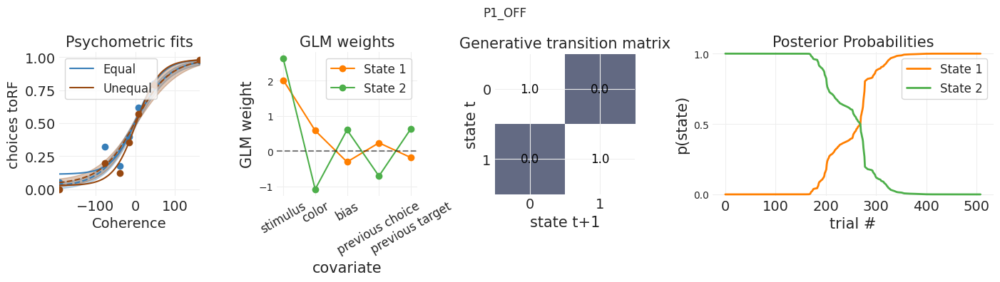

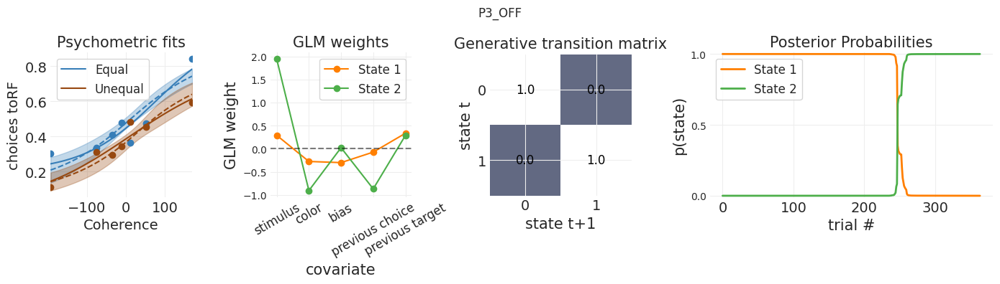

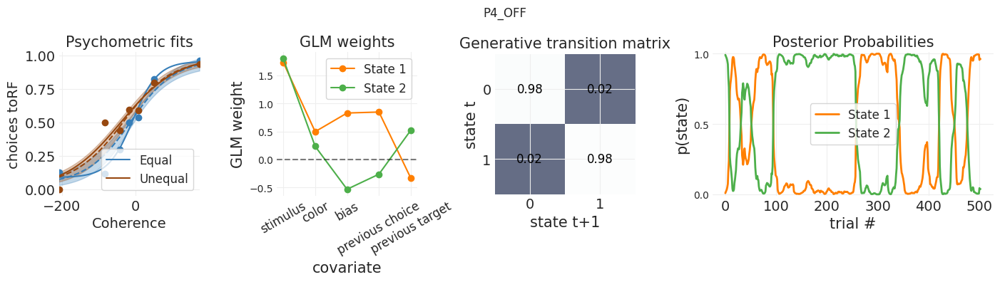

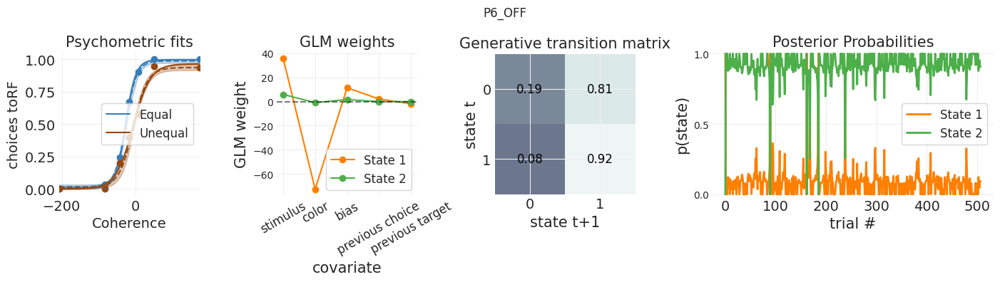

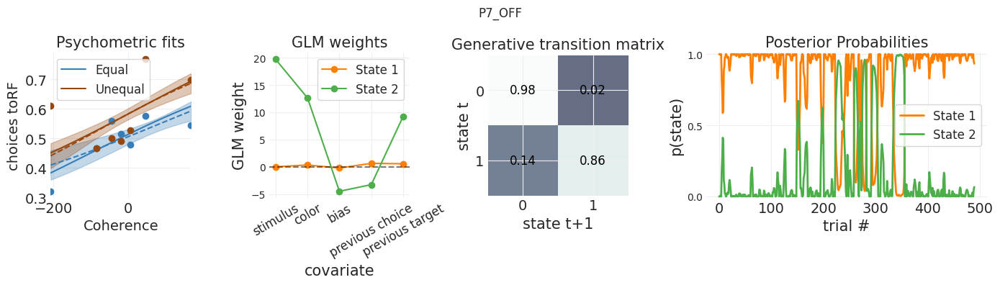

...

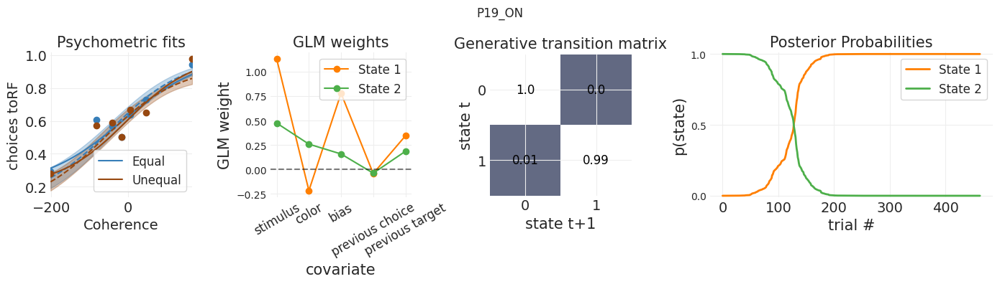

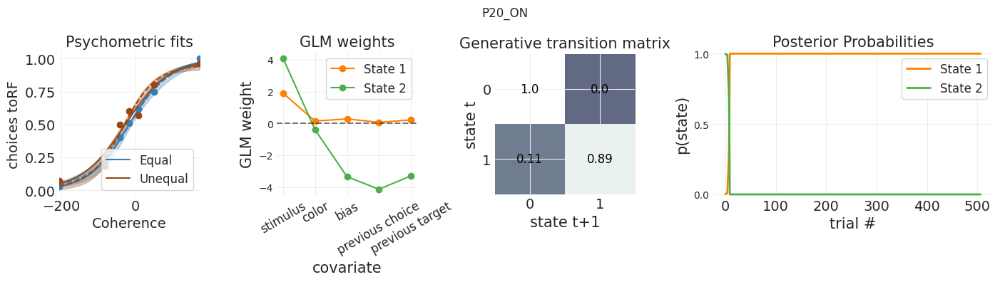

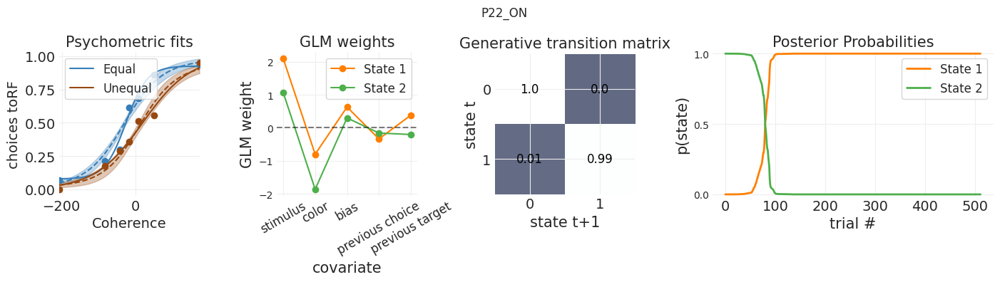

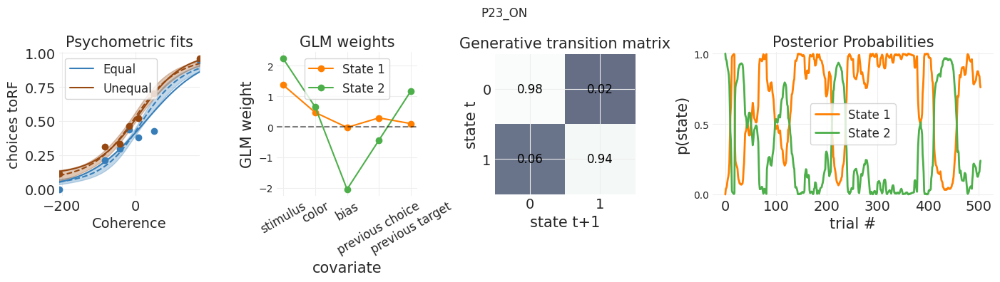

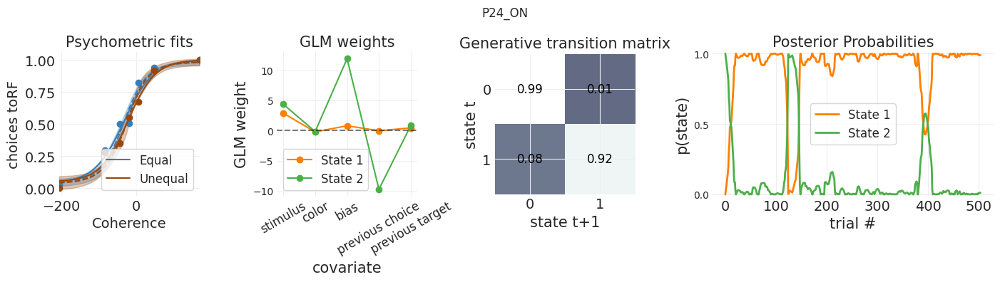

In [13]:
for idx_session, session in enumerate(glm_hmm["session_wise"]['session_ids']):
    train_idx = train_fold[session]
    model = glm_hmm["session_wise"]['models'][idx_session][best_state][best_fold_session_wise[idx_session]]
    choices = glm_hmm["session_wise"]["choices"][idx_session].reshape(-1, 1)
    input = np.array(glm_hmm["session_wise"]["inputs"][idx_session])

    stimulus = glm_hmm["session_wise"]["inputs"][idx_session][:,0].reshape(-1, 1)

    if glm_hmm["session_wise"]["masks"][idx_session] is None:
        mask = None
    else:
        mask = glm_hmm["session_wise"]["masks"][idx_session].reshape(-1, 1)
    mask = np.ones_like(choices, dtype=bool) if mask is None else mask
    plot_model_fits(model, choices, input, stimulus, mask, best_state, session, trial_indices=train_idx)


### Test Dataset

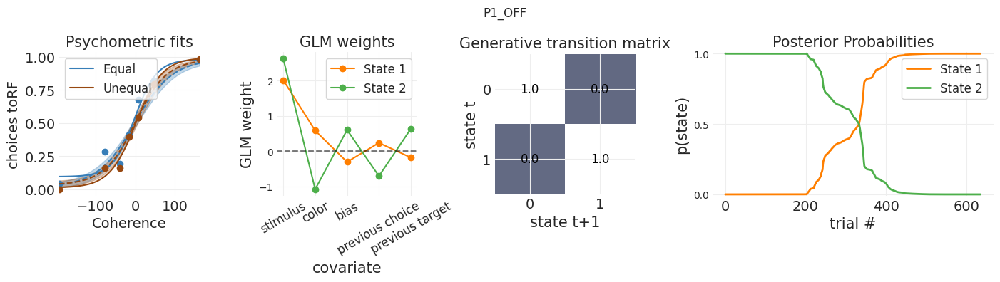

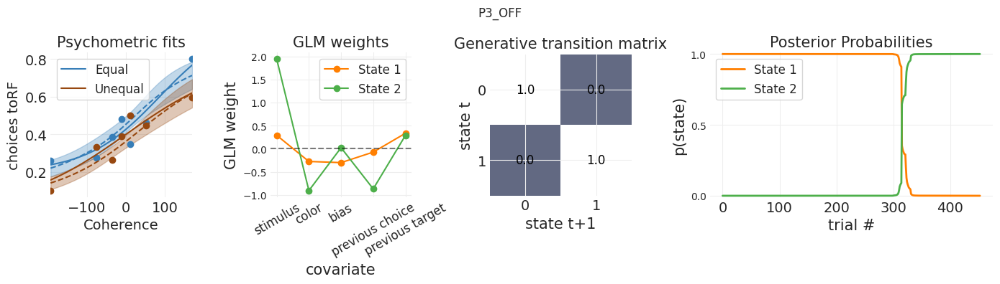

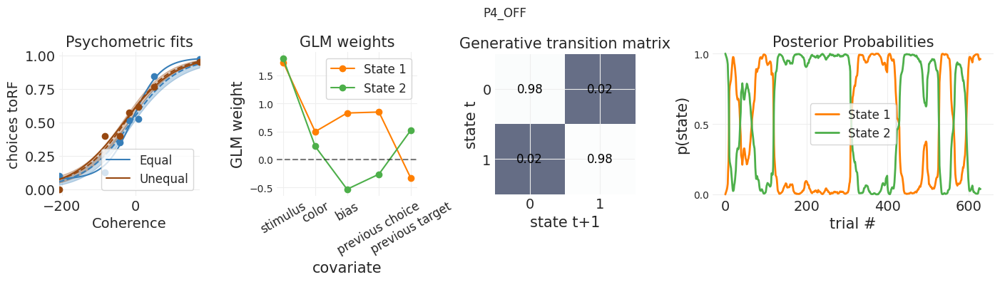

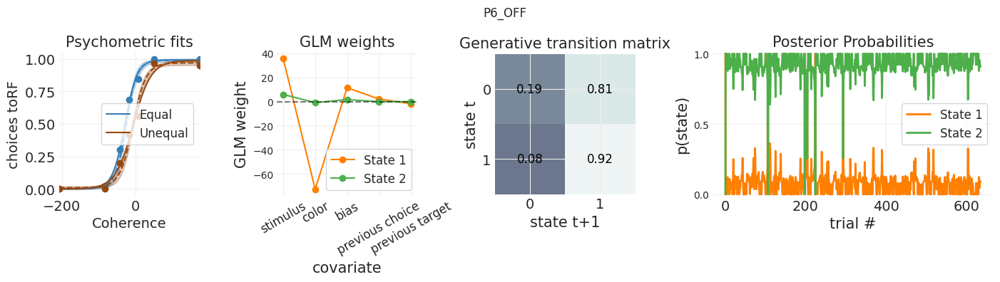

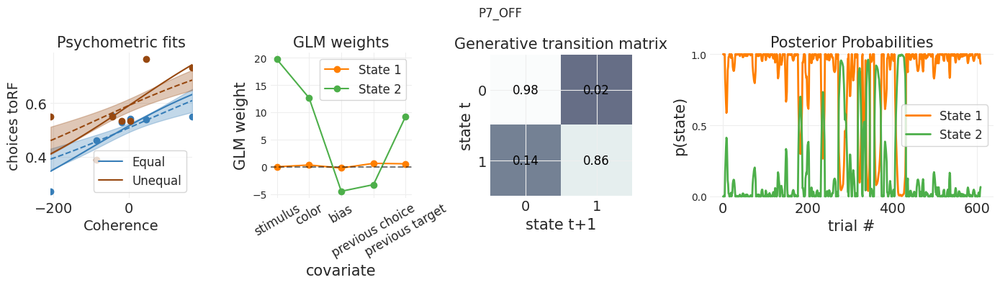

...

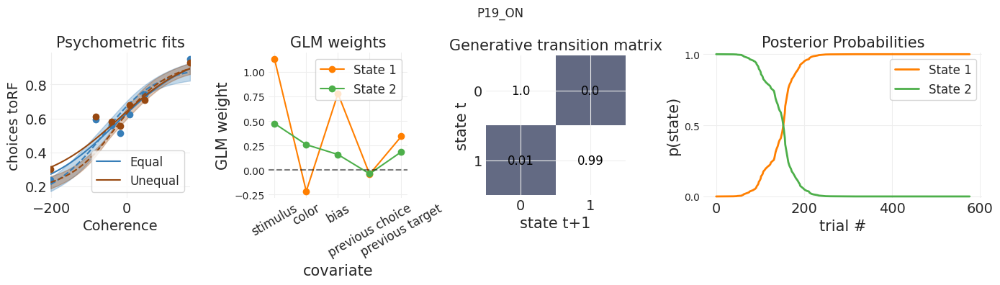

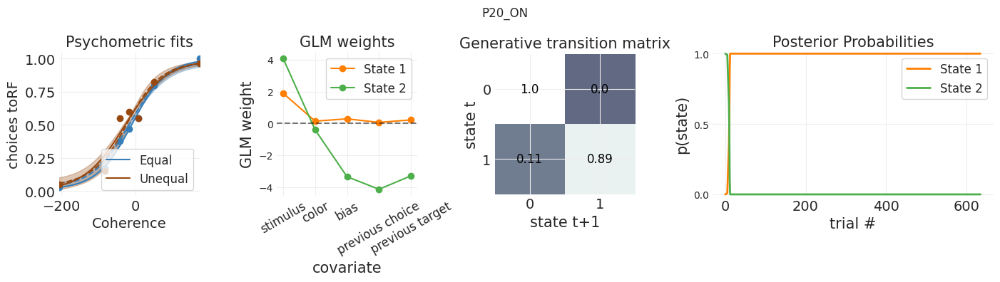

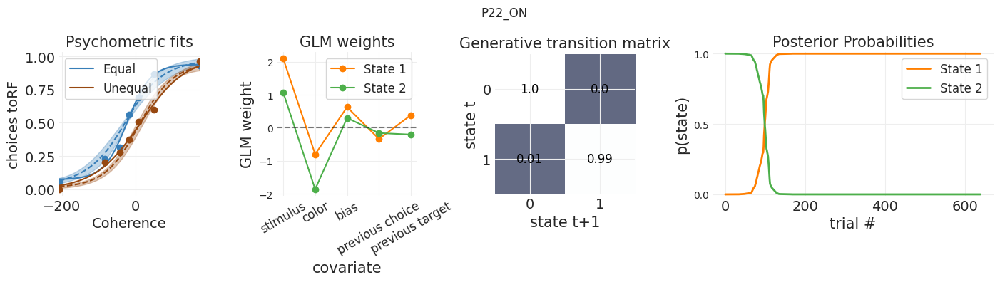

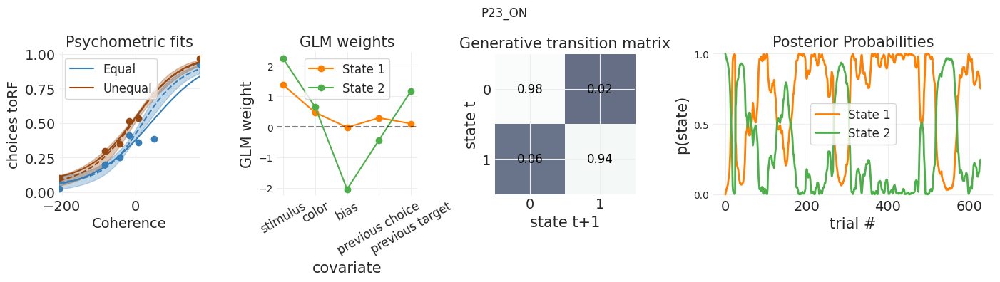

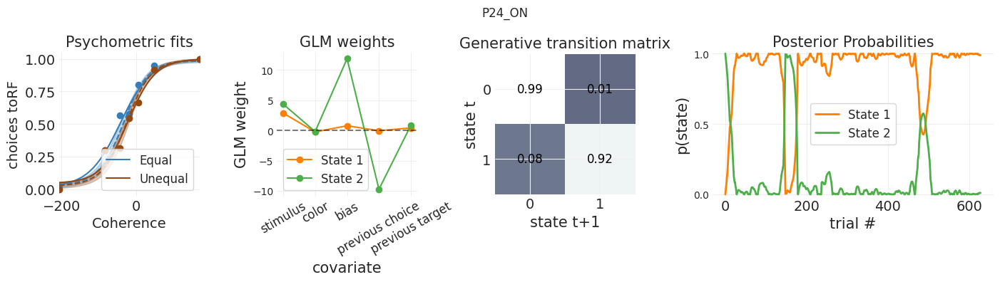

In [14]:
for idx_session, session in enumerate(glm_hmm["session_wise"]['session_ids']):
    test_idx = test_fold[session]
    model = glm_hmm["session_wise"]['models'][idx_session][best_state][best_fold_session_wise[idx_session]]
    choices = glm_hmm["session_wise"]["choices"][idx_session].reshape(-1, 1)
    input = np.array(glm_hmm["session_wise"]["inputs"][idx_session])

    stimulus = glm_hmm["session_wise"]["inputs"][idx_session][:,0].reshape(-1, 1)

    if glm_hmm["session_wise"]["masks"][idx_session] is None:
        mask = None
    else:
        mask = glm_hmm["session_wise"]["masks"][idx_session].reshape(-1, 1)

    plot_model_fits(model, choices, input, stimulus, mask, best_state, session, trial_indices=None)

## Fit on whole session

In [15]:
# get parameter initializations for each session
init_params = {
    'glm_weights': {},
    'transition_matrices': {}
}
choices_session_wise, inputs_session_wise, masks_session_wise = [], [], []

# choose best state and best fold model parameters to initialize
for idx_session, session in enumerate(glm_hmm["session_wise"]['session_ids']):
    init_params['glm_weights'][idx_session] = glm_hmm["session_wise"]['models'][idx_session][best_state][best_fold_session_wise[idx_session]].observations.params
    init_params['transition_matrices'][idx_session] = glm_hmm["session_wise"]['models'][idx_session][best_state][best_fold_session_wise[idx_session]].transitions.params


    choices_session_wise.append(glm_hmm["session_wise"]["choices"][idx_session].reshape(-1, 1))
    inputs_session_wise.append(np.array(glm_hmm["session_wise"]["inputs"][idx_session]))
    masks_session_wise.append(glm_hmm["session_wise"]["masks"][idx_session].reshape(-1, 1))


In [16]:
models_session, fit_ll_session = session_wise_fit(choices_session_wise, inputs_session_wise, masks=masks_session_wise,
                                                                                    n_sessions=len((glm_hmm["session_wise"]['session_ids'])), init_params=init_params, n_states = best_state, n_iters= 1000)

models_session_wise, fit_lls_session_wise ={},{}
for idx_session, session in enumerate(glm_hmm["session_wise"]['session_ids']):
    models_session_wise[session] = models_session[idx_session]
    fit_lls_session_wise[session] = fit_ll_session[idx_session]

Fitting sessions: 100%|██████████| 32/32 [00:00<00:00, 276737.58it/s]


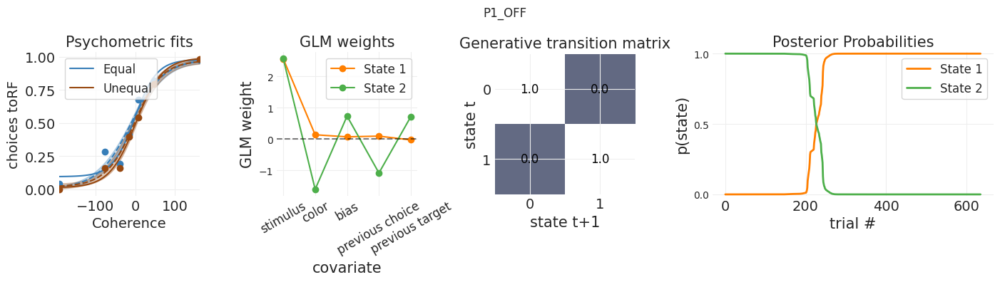

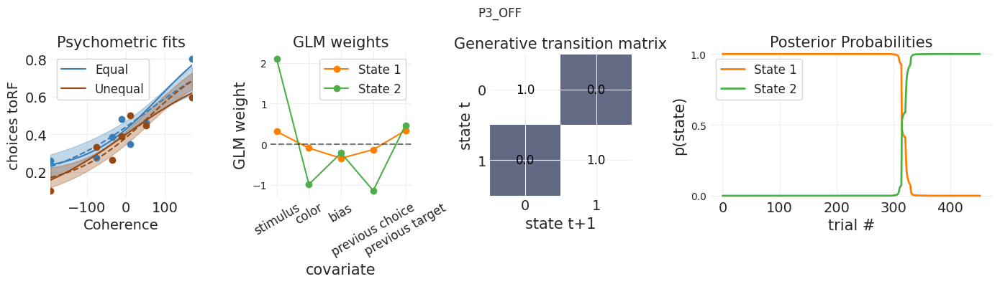

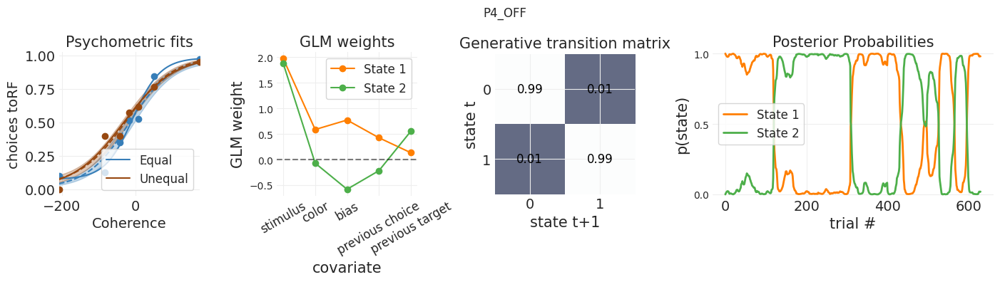

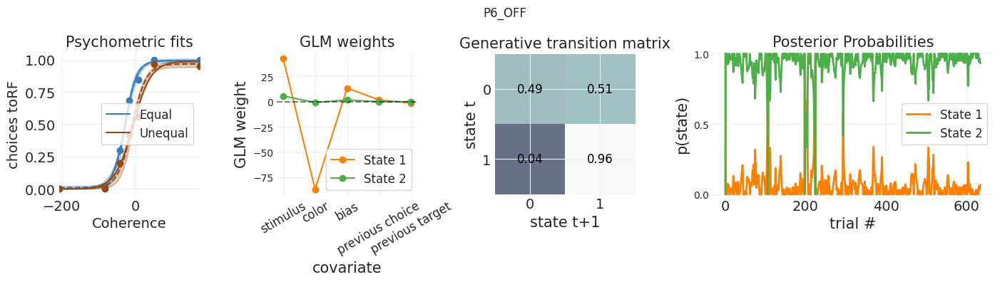

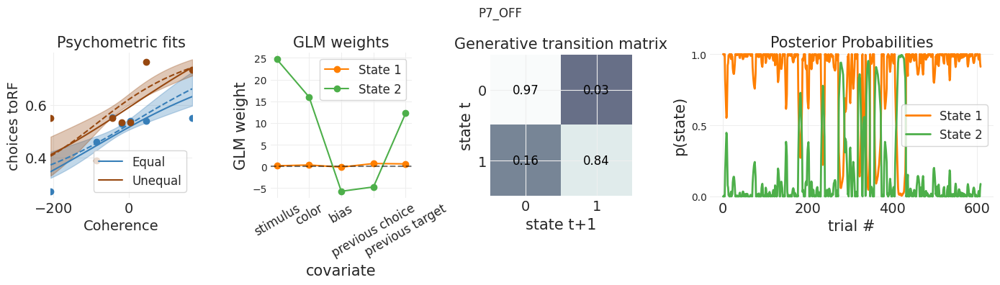

...

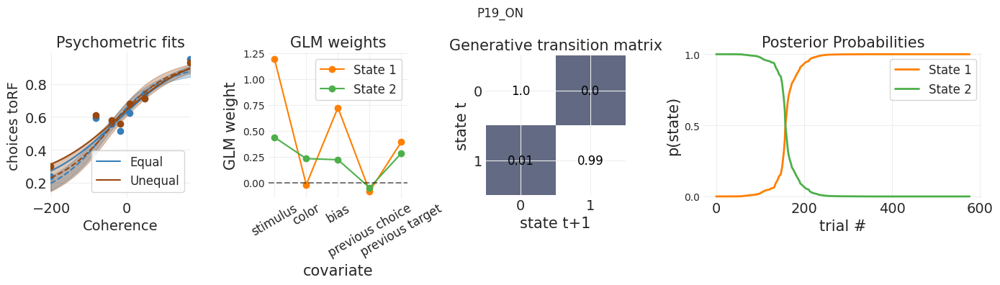

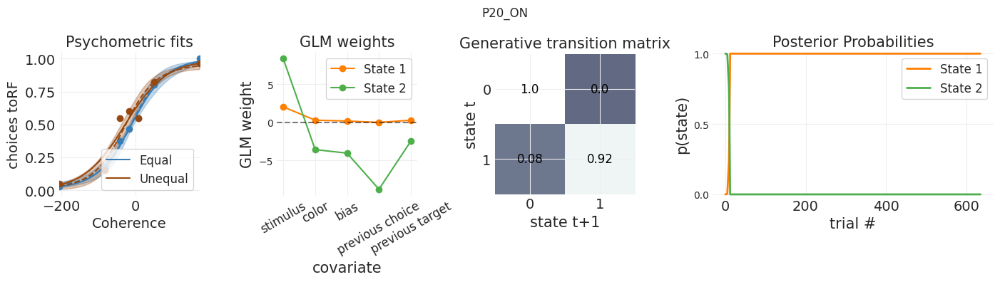

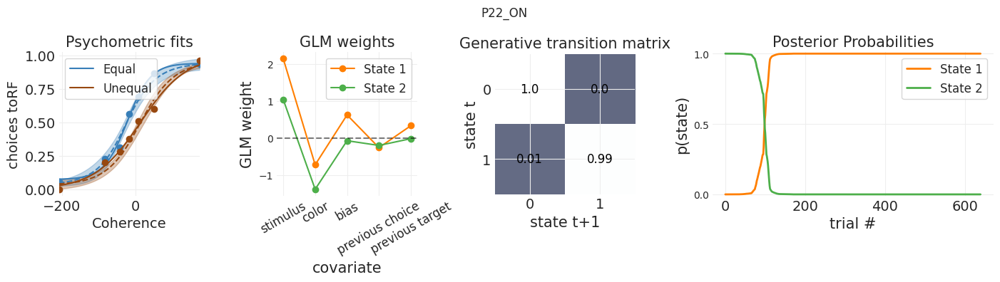

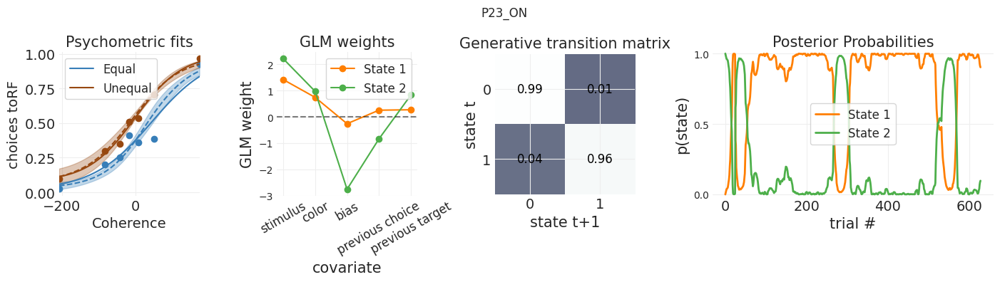

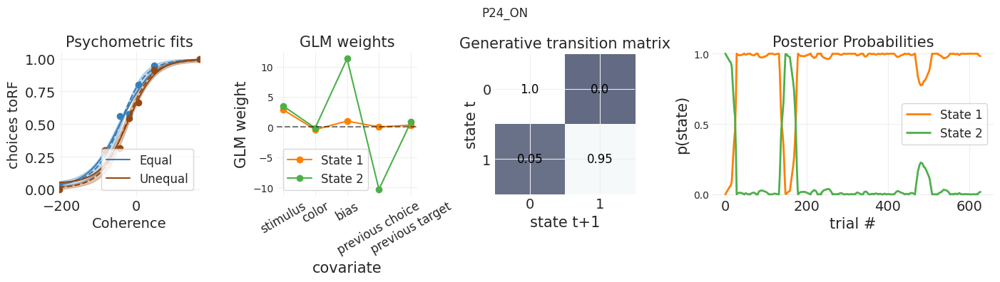

In [17]:
for idx_session, session in enumerate(glm_hmm["session_wise"]['session_ids']):

    model = models_session_wise[session]
    choices = glm_hmm["session_wise"]["choices"][idx_session].reshape(-1, 1)
    input = np.array(glm_hmm["session_wise"]["inputs"][idx_session])

    stimulus = glm_hmm["session_wise"]["inputs"][idx_session][:,0].reshape(-1, 1)

    if glm_hmm["session_wise"]["masks"][idx_session] is None:
        mask = None
    else:
        mask = glm_hmm["session_wise"]["masks"][idx_session].reshape(-1, 1)

    plot_model_fits(model, choices, input, stimulus, mask, best_state, session, trial_indices=None)

### Save whole model

In [18]:
# store data and models for session-wise
session_wise_fits = {
    'models': models_session_wise,
    'fit_lls': fit_lls_session_wise,
    'inputs': inputs_session_wise,
    'choices': choices_session_wise,
    'masks': masks_session_wise,
    'unnormalized_inputs': glm_hmm["session_wise"]["unnormalized_inputs"],
    'session_ids': glm_hmm["session_wise"]['session_ids']
}

models_and_data = {
    'session_wise': session_wise_fits,
}

with open(Path(processed_dir, f'glm_hmm_final.pkl'), 'wb') as f:
    pickle.dump(models_and_data, f)

# Condition-wise plot

In [32]:
subjects = metadata['subject_id'].unique()
session_ids = np.array(glm_hmm["session_wise"]['session_ids'])

rows = []

for session_id in session_ids:
	subject = session_id.split('_')[0]
	medication = session_id.split('_')[1]

	model = models_session_wise[session_id]
	params = -np.array(model.observations.params).reshape(best_state, -1)
	row = {
		'subject_id': subject,
		'medication': medication,
		'state_1_stimulus': params[0, 0],
		'state_1_color': params[0, 1],
		'state_1_bias': params[0, 2],
		'state_2_stimulus': params[1, 0],
		'state_2_color': params[1, 1],
		'state_2_bias': params[1, 2],
	}

	# Dynamically add extra features based on model.M
	if model.M > 3:
		row["state_1_prev_choice"] = params[0, 3]
		row["state_2_prev_choice"] = params[1, 3]
	if model.M > 4:
		row["state_1_prev_target"] = params[0, 4]
		row["state_2_prev_target"] = params[1, 4]
	if model.M > 5:
		row["state_1_prev_color"] = params[0, 5]
		row["state_2_prev_color"] = params[1, 5]

	# Append row to list
	rows.append(row)


pd_glm_hmm = pd.DataFrame(rows)

In [34]:
trem_subjects = metadata.loc[metadata['categorization'] == 'tremor_dominant']['subject_id'].unique()
brady_subjects = metadata.loc[metadata['categorization'] == 'bradykinesia_dominant']['subject_id'].unique()

Wilcoxon signed-rank test for state_1_stimulus: statistic=16.000, p-value=0.84375
Wilcoxon signed-rank test for state_1_color: statistic=14.000, p-value=0.64062
Wilcoxon signed-rank test for state_1_bias: statistic=12.000, p-value=0.46094
Wilcoxon signed-rank test for state_1_prev_choice: statistic=15.000, p-value=0.74219
Wilcoxon signed-rank test for state_1_prev_target: statistic=15.000, p-value=0.74219
Wilcoxon signed-rank test for state_2_stimulus: statistic=4.000, p-value=0.05469
Wilcoxon signed-rank test for state_2_color: statistic=9.000, p-value=0.25000
Wilcoxon signed-rank test for state_2_bias: statistic=16.000, p-value=0.84375
Wilcoxon signed-rank test for state_2_prev_choice: statistic=17.000, p-value=0.94531
Wilcoxon signed-rank test for state_2_prev_target: statistic=6.000, p-value=0.10938


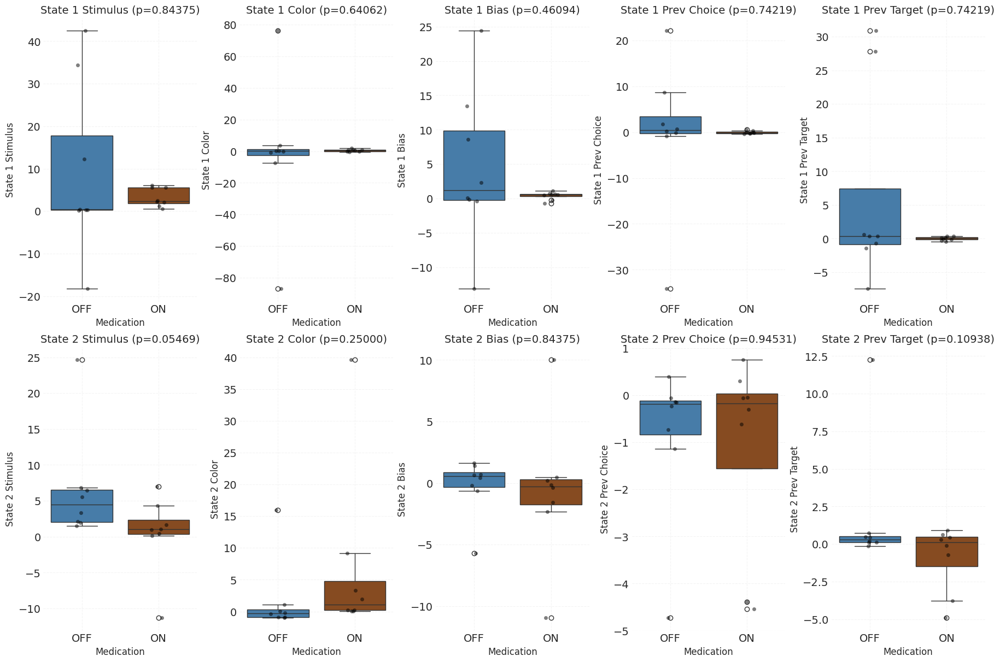

In [ ]:
subject_group = trem_subjects
# subject_group = brady_subjects
df = pd_glm_hmm.copy()
df = df[df['subject_id'].isin(subject_group)].reset_index(drop=True)

import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_rel, wilcoxon, shapiro

# Prepare figure with subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 5, figsize=(18, 12))

# Features for both states
features = [
	["state_1_stimulus", "state_1_color", "state_1_bias", "state_1_prev_choice", "state_1_prev_target"],
	["state_2_stimulus", "state_2_color", "state_2_bias", "state_2_prev_choice", "state_2_prev_target"],
]
titles = [
	["State 1 Stimulus", "State 1 Color", "State 1 Bias", "State 1 Prev Choice", "State 1 Prev Target"],
	["State 2 Stimulus", "State 2 Color", "State 2 Bias", "State 2 Prev Choice", "State 2 Prev Target"],
]
colors = ["#377eb8", "#974810"]  # OFF (blue), ON (brown)

for row in range(2):  # Iterate over states (state 1 and state 2)
	for col in range(5):  # Iterate over stimulus, color, bias
		feature = features[row][col]
		ax = axes[row, col]

		# Filter ON and OFF data
		on_data = df[df["medication"] == "ON"][feature]
		off_data = df[df["medication"] == "OFF"][feature]

		# Ensure equal pairing
		common_subjects = set(df[df["medication"] == "ON"]["subject_id"]) & set(
			df[df["medication"] == "OFF"]["subject_id"]
		)
		on_data = df[(df["medication"] == "ON") & (df["subject_id"].isin(common_subjects))][feature]
		off_data = df[(df["medication"] == "OFF") & (df["subject_id"].isin(common_subjects))][feature]

		stat, p_value = wilcoxon(off_data, on_data)
		test_name = "Wilcoxon signed-rank test"

		# # Normality check
		# _, p_on = shapiro(on_data)
		# _, p_off = shapiro(off_data)
		# # Choose appropriate test
		# if p_on > 0.05 and p_off > 0.05:
		#     stat, p_value = ttest_rel(off_data, on_data)
		#     test_name = "Paired t-test"
		# else:
		#     stat, p_value = wilcoxon(off_data, on_data)
		#     test_name = "Wilcoxon signed-rank test"

		# Print test results
		print(f"{test_name} for {feature}: statistic={stat:.3f}, p-value={p_value:.5f}")

		# Plot boxplot and stripplot
		sns.boxplot(x="medication", y=feature, data=df, palette=colors, ax=ax)
		sns.stripplot(x="medication", y=feature, data=df, color="black", alpha=0.5, jitter=True, ax=ax)

		# Formatting
		ax.set_title(f"{titles[row][col]} (p={p_value:.5f})", fontsize=14)
		ax.set_xlabel("Medication", fontsize=12)
		ax.set_ylabel(titles[row][col], fontsize=12)
		ax.grid(True, linestyle="--", alpha=0.6)

# Adjust layout and show
plt.tight_layout()
plt.show()

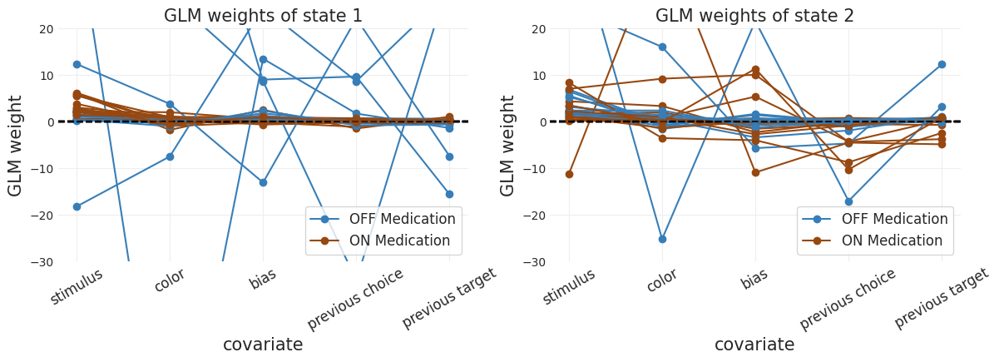

In [23]:
subjects = metadata['subject_id'].unique()
session_ids = np.array(glm_hmm["session_wise"]['session_ids'])

# 2 x 2 plot (color specific weights X 2 states X 2 medications)
fig = plt.figure(figsize=(14, 8))  # Wider figure for better spacing
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])  # Two subplots with equal size

cols = ['#377eb8', '#974810']  # Colors for awayRF and toRF
covariates = ['stimulus', 'color', 'bias', 'previous choice', 'previous target', 'previour color']
legend_added = {0: {cols[0]: False, cols[1]: False}, 1: {cols[0]: False, cols[1]: False}}  # Track legends per subplot


for subject in subjects:
    for medication in ["OFF", "ON"]:
        model = models_session_wise[f"{subject}_{medication}"]
        params = -np.array(model.observations.params).reshape(best_state, -1)
        # Determine the color and label
        color = cols[0] if medication == "OFF" else cols[1]
        label = "OFF Medication" if medication == "OFF" else "ON Medication"

        for state in range(best_state):
            ax = plt.subplot(gs[state])
            # Only add legend once per color per subplot
            if not legend_added[state][color]:
                ax.plot(
                    np.arange(model.M),
                    params[state],
                    marker="o",
                    color=color,
                    linestyle="-",
                    lw=1.5,
                    label=label,
                )
                legend_added[state][color] = True  # Mark color as used for this subplot
            else:
                ax.plot(
                    np.arange(model.M),
                    params[state],
                    marker="o",
                    color=color,
                    linestyle="-",
                    lw=1.5,
                )

            # Formatting
            ax.tick_params(axis="y", labelsize=10)
            ax.set_ylabel("GLM weight", fontsize=15)
            ax.set_xlabel("covariate", fontsize=15)
            ax.set_xticks(range(model.M))
            ax.set_ylim([-30, 20])

            ax.set_xticklabels(covariates[: model.M], fontsize=12, rotation=30)
            ax.axhline(y=0, color="k", alpha=0.5, ls="--")

            ax.legend()  # Legend appears, but only one instance of each color per subplot
            ax.set_title(f"GLM weights of state {state + 1}", fontsize=15)


<Figure size 1400x800 with 0 Axes>

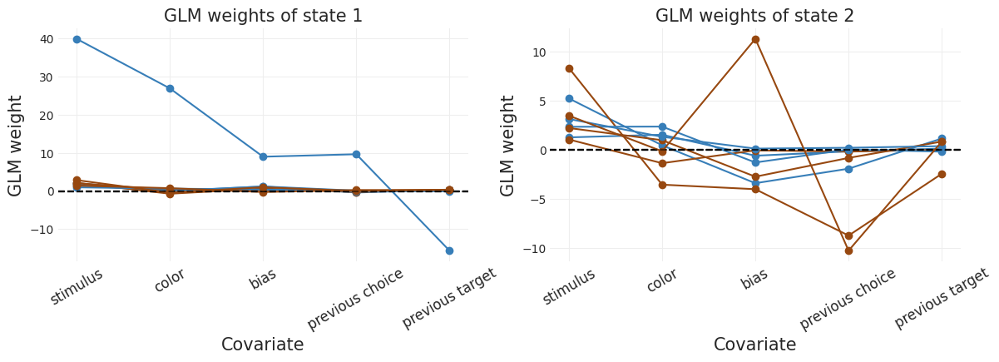

In [24]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import gridspec

fig1 = plt.figure(figsize=(14, 8))  # Figure for tremor subjects
gs1 = gridspec.GridSpec(2, 2, width_ratios=[1, 1])
fig2 = plt.figure(figsize=(14, 8))  # Figure for bradykinesia subjects
gs2 = gridspec.GridSpec(2, 2, width_ratios=[1, 1])

cols = ["#377eb8", "#974810"]  # Colors for OFF and ON medications
covariates = [
    "stimulus",
    "color",
    "bias",
    "previous choice",
    "previous target",
    "previour color",
]
legend_added = {  # Track legends per subplot
    0: {cols[0]: False, cols[1]: False},
    1: {cols[0]: False, cols[1]: False},
}

# Loop through subjects and medications
for subject in subjects:
    if subject in trem_subjects:
        fig = fig1
        gs = gs1
    elif subject in brady_subjects:
        fig = fig2
        gs = gs2

    for medication in ["OFF", "ON"]:
        model = models_session_wise[f"{subject}_{medication}"]
        params = -np.array(model.observations.params).reshape(best_state, -1)

        # Determine color and label based on medication
        color = cols[0] if medication == "OFF" else cols[1]
        label = "OFF Medication" if medication == "OFF" else "ON Medication"

        for state in range(best_state):
            ax = plt.subplot(gs[state])  # Adjusted indexing for subplots

            # Plotting and managing legend
            if not legend_added[state][color]:
                ax.plot(
                    np.arange(model.M),
                    params[state],
                    marker="o",
                    color=color,
                    linestyle="-",
                    lw=1.5,
                    label=label,
                )
                legend_added[state][color] = True  # Mark color as used for this subplot
                ax.legend()
            else:
                ax.plot(
                    np.arange(model.M),
                    params[state],
                    marker="o",
                    color=color,
                    linestyle="-",
                    lw=1.5,
                )

            # Formatting for each axis
            ax.tick_params(axis="y", labelsize=10)
            ax.set_ylabel("GLM weight", fontsize=15)
            ax.set_xlabel("Covariate", fontsize=15)
            ax.set_xticks(range(model.M))
            ax.set_xticklabels(
                covariates[: model.M],
                fontsize=12,
                rotation=30,
            )
            ax.axhline(y=0, color="k", alpha=0.5, ls="--")  # Zero line
            ax.set_title(f"GLM weights of state {state + 1}", fontsize=15)


# Show the figures
plt.figure(fig1)
plt.figure(fig2)
plt.show()

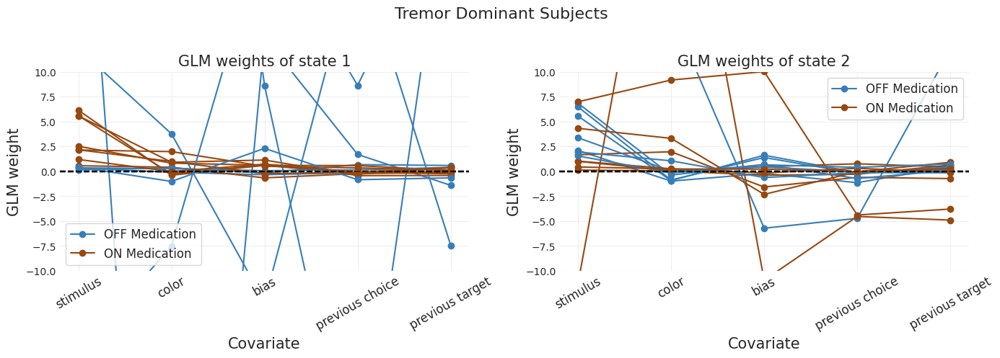

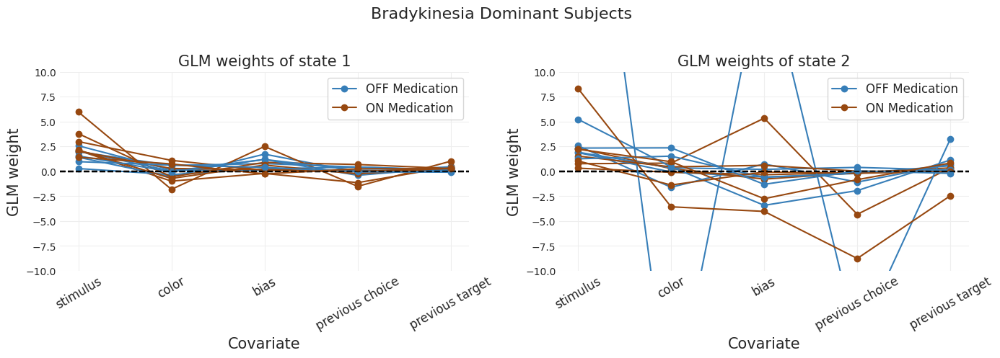

In [25]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import gridspec


for category in ['Tremor Dominant', 'Bradykinesia Dominant']:
    fig = plt.figure(figsize=(14, 8))  # Figure for tremor subjects
    gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])
    cols = ["#377eb8", "#974810"]  # Colors for OFF and ON medications
    covariates = [
        "stimulus",
        "color",
        "bias",
        "previous choice",
        "previous target",
        "previour color",
    ]
    legend_added = {  # Track legends per subplot
        0: {cols[0]: False, cols[1]: False},
        1: {cols[0]: False, cols[1]: False},
    }

    if category == "Tremor Dominant":
        subjects = trem_subjects
    elif category == "Bradykinesia Dominant":
        subjects = brady_subjects
    for subject in subjects:
        for medication in ["OFF", "ON"]:
            model = models_session_wise[f"{subject}_{medication}"]
            params = -np.array(model.observations.params).reshape(best_state, -1)

            # Determine color and label based on medication
            color = cols[0] if medication == "OFF" else cols[1]
            label = "OFF Medication" if medication == "OFF" else "ON Medication"

            for state in range(best_state):
                ax = plt.subplot(gs[state])  # Adjusted indexing for subplots

                # Plotting and managing legend
                if not legend_added[state][color]:
                    ax.plot(
                        np.arange(model.M),
                        params[state],
                        marker="o",
                        color=color,
                        linestyle="-",
                        lw=1.5,
                        label=label,
                    )
                    legend_added[state][color] = (
                        True  # Mark color as used for this subplot
                    )
                    ax.legend()
                else:
                    ax.plot(
                        np.arange(model.M),
                        params[state],
                        marker="o",
                        color=color,
                        linestyle="-",
                        lw=1.5,
                    )

                # Formatting for each axis
                ax.tick_params(axis="y", labelsize=10)
                ax.set_ylabel("GLM weight", fontsize=15)
                ax.set_xlabel("Covariate", fontsize=15)
                ax.set_xticks(range(model.M))
                ax.set_xticklabels(
                    covariates[: model.M],
                    fontsize=12,
                    rotation=30,
                )
                ax.axhline(y=0, color="k", alpha=0.5, ls="--")  # Zero line
                ax.set_title(f"GLM weights of state {state + 1}", fontsize=15)
                ax.set_ylim([-10, 10])

    # Show the figures
    plt.suptitle(f"{category} Subjects", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit title
    plt.show()




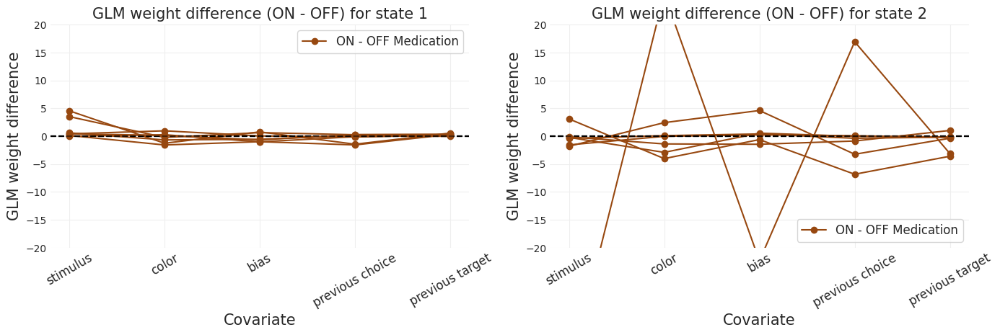

In [26]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import gridspec

fig = plt.figure(figsize=(14, 8))  # Wider figure for better spacing
gs = gridspec.GridSpec(2, 2, width_ratios=[1, 1])  # Two subplots with equal size

cols = ["#377eb8", "#974810"]  # Colors for OFF and ON medications
covariates = [
    "stimulus",
    "color",
    "bias",
    "previous choice",
    "previous target",
    "previour color",
]
legend_added = {  # Track legends per subplot
    0: {cols[0]: False, cols[1]: False},
    1: {cols[0]: False, cols[1]: False},
}

# Loop through subjects
for subject in subjects:
    if subject in trem_subjects:
        condition = 0
    elif subject in brady_subjects:
        condition = 1

    # Get the ON and OFF medication params for the subject
    model_off = models_session_wise[f"{subject}_OFF"]
    model_on = models_session_wise[f"{subject}_ON"]

    params_off = -np.array(model_off.observations.params).reshape(best_state, -1)
    params_on = -np.array(model_on.observations.params).reshape(best_state, -1)

    # Calculate the difference (ON - OFF)
    params_diff = params_on - params_off

    # Plotting the difference
    for state in range(best_state):
        ax = plt.subplot(
            gs[(condition * best_state) + state]
        )  # Adjusted indexing for subplots

        # Plotting the difference between ON and OFF medication params
        ax.plot(
            np.arange(model.M),
            params_diff[state],
            marker="o",
            color=cols[1],  # Use the ON color for the difference plot (can be adjusted)
            linestyle="-",
            lw=1.5,
            label="ON - OFF Medication",
        )

		# Formatting for each axis
        if state == 0:
            ax.set_ylim([-20, 20])
        elif state == 1:
            ax.set_ylim([-20, 20])

        ax.tick_params(axis="y", labelsize=10)
        ax.set_ylabel("GLM weight difference", fontsize=15)
        ax.set_xlabel("Covariate", fontsize=15)
        ax.set_xticks(range(model.M))
        ax.set_xticklabels(
            covariates[: model.M],
            fontsize=12,
            rotation=30,
        )
        ax.axhline(y=0, color="k", alpha=0.5, ls="--")  # Zero line

        # Only add the legend once for the difference plot
        if not legend_added[state][cols[1]]:
            ax.legend()
            legend_added[state][cols[1]] = True  # Mark color as used for this subplot

        ax.set_title(
            f"GLM weight difference (ON - OFF) for state {state + 1}", fontsize=15
        )

# Show the plot
plt.tight_layout()
plt.show()
